# Introduction

Culture, as I refer to it here, is a set of shared schemas (i.e. ideas about the world) between members of a certain community that help to shape individual behavior. These schemas can be either consciously or unconsciously held and they are generally maintained through in-group and out-group dynamics. By the latter, I mean that they act as rules for social behavior and through them, group membership is determined on a continuous scale (i.e. from full belonging to full unbelonging). Additionally, a single individual can belong to a wide variety of communities, each with their own cultures, and these communities can, but do not necessarily have to, overlap in both the schemas they endorse and the members that make them up. 

With this definition of culture as the base, I will set out to identify body image related cultural patterns in the 'fictional' community within the TV show Friends. More specifically, I seek to identify different potential legisigns that are conventionalized in the show referring to body image constructs. To understand what sign relations would underlie these legisigns, it is best to use a hypothesized example. I expect that being fat will be normatively judged as negative in the way that it is portrayed in the show. In this example, the object would be that being fat is a bad thing; the sign vehicle would be (as one of many potential examples within this example) increased demeaning language associated with fatness when discussed by the characters in the show; the interpretant would be the reaction of the viewer as "being fat is bad, and if I am not as skinny as they are, I should be ashamed". The relationship between the object and sign-vehicle is symbolic: it is conventionally agreed upon that demeaning language indicates that whatever is being demeaned is a negative characteristic. The relationship between the sign-vehicle and the interpretant is argumentative: various complex propositions (i.e. fat is bad; I am fat; I should feel bad because I am fat) are being brought together through convention. Finally, each instance that these associatons are made in the show is a replica of each legisign, and these legisigns are reinforced through repeated replication. 

In order to identify and interpret the specific body image legisigns that are being conventionalized in the show, I will follow a multi-step analytical plan. First, to identify whether body image is one of the main constructs discussed in the show, I will plot the top lemmas after calculating TFIDF for each. Second, I will find all the ocurrences of a list of body image words through the whole series to identify which are being used more than others. Third, I will explore the Word2Vec associations for these words to identify what context they are being used in. Fourth, I will look at the frequency of usage of the body image words by speaker (each main character). Finally, I will trace the frequency of use of these words through the ten seasons of the show, to span the decade between 1994 and 2004.

# Let's get started!

In [1]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import nltk
import string
from gensim import corpora, models
import re
import matplotlib.pyplot as plt
import json
from sklearn.manifold import TSNE
import numpy as np
from functools import reduce

nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('tagsets') 
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package tagsets to /root/nltk_data...
[nltk_data]   Unzipping help/tagsets.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

### Scrape links

In [2]:
html = requests.get("https://fangj.github.io/friends")
soup = BeautifulSoup(html.text, "html.parser") # get the HTML of the main page to scrape all the links
print(soup.prettify())

<!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.01 Transitional//EN">
<html>
 <head>
  <title>
   Friends Transcripts
  </title>
  <meta content="text/html; charset=utf-8" http-equiv="Content-Type"/>
 </head>
 <body>
  <h3>
   SEASON 1
  </h3>
  <ul>
   <li>
    <a href="season/0101.html">
     101  Monica Gets A Roommate
    </a>
   </li>
   <li>
    <a href="season/0102.html">
     102  The Sonogram At The End
    </a>
   </li>
   <li>
    <a href="season/0103.html">
     103  The Thumb
    </a>
   </li>
   <li>
    <a href="season/0104.html">
     104  George Stephanopoulos
    </a>
   </li>
   <li>
    <a href="season/0105.html">
     105  The East German Laundry Detergent
    </a>
   </li>
   <li>
    <a href="season/0106.html">
     106  The Butt
    </a>
   </li>
   <li>
    <a href="season/0107.html">
     107  The Blackout
    </a>
   </li>
   <li>
    <a href="season/0108.html">
     108  Nana Dies Twice
    </a>
   </li>
   <li>
    <a href="season/0109.html">
     109  Underdog G

In [3]:
# because of the way the HTML of the website is set up, each season is under a different <ul> item, so first I am going to find all of these
first_anchors = soup.find_all('ul')
first_anchors[0]

<ul>
<li><a href="season/0101.html">101  Monica Gets A Roommate </a></li>
<li><a href="season/0102.html">102  The Sonogram At The End </a></li>
<li><a href="season/0103.html">103  The Thumb </a></li>
<li><a href="season/0104.html">104  George Stephanopoulos </a></li>
<li><a href="season/0105.html">105  The East German Laundry Detergent </a></li>
<li><a href="season/0106.html">106  The Butt </a></li>
<li><a href="season/0107.html">107  The Blackout </a></li>
<li><a href="season/0108.html">108  Nana Dies Twice </a></li>
<li><a href="season/0109.html">109  Underdog Gets Away </a></li>
<li><a href="season/0110.html">110  The Monkey </a></li>
<li><a href="season/0111.html">111  Mrs. Bing </a></li>
<li><a href="season/0112.html">112  The Dozen Lasagnas </a></li>
<li><a href="season/0113.html">113  The Boobies </a></li>
<li><a href="season/0114.html">114  The Candy Hearts </a></li>
<li><a href="season/0115.html">115  The Stoned Guy </a></li>
<li><a href="season/0116.html">116  The Two Parts, 

In [4]:
# now, for each <ul>, I will find all the "a" items
second_anchors = [i.find_all('a') for i in first_anchors]
second_anchors

[[<a href="season/0101.html">101  Monica Gets A Roommate </a>,
  <a href="season/0102.html">102  The Sonogram At The End </a>,
  <a href="season/0103.html">103  The Thumb </a>,
  <a href="season/0104.html">104  George Stephanopoulos </a>,
  <a href="season/0105.html">105  The East German Laundry Detergent </a>,
  <a href="season/0106.html">106  The Butt </a>,
  <a href="season/0107.html">107  The Blackout </a>,
  <a href="season/0108.html">108  Nana Dies Twice </a>,
  <a href="season/0109.html">109  Underdog Gets Away </a>,
  <a href="season/0110.html">110  The Monkey </a>,
  <a href="season/0111.html">111  Mrs. Bing </a>,
  <a href="season/0112.html">112  The Dozen Lasagnas </a>,
  <a href="season/0113.html">113  The Boobies </a>,
  <a href="season/0114.html">114  The Candy Hearts </a>,
  <a href="season/0115.html">115  The Stoned Guy </a>,
  <a href="season/0116.html">116  The Two Parts, Part I </a>,
  <a href="season/0117.html">117  The Two Parts, Part II </a>,
  <a href="season/011

In [5]:
# unlist second_anchors because each set of season links is a sublist within the big list
flat_anchors = [item for sublist in second_anchors for item in sublist]
flat_anchors

[<a href="season/0101.html">101  Monica Gets A Roommate </a>,
 <a href="season/0102.html">102  The Sonogram At The End </a>,
 <a href="season/0103.html">103  The Thumb </a>,
 <a href="season/0104.html">104  George Stephanopoulos </a>,
 <a href="season/0105.html">105  The East German Laundry Detergent </a>,
 <a href="season/0106.html">106  The Butt </a>,
 <a href="season/0107.html">107  The Blackout </a>,
 <a href="season/0108.html">108  Nana Dies Twice </a>,
 <a href="season/0109.html">109  Underdog Gets Away </a>,
 <a href="season/0110.html">110  The Monkey </a>,
 <a href="season/0111.html">111  Mrs. Bing </a>,
 <a href="season/0112.html">112  The Dozen Lasagnas </a>,
 <a href="season/0113.html">113  The Boobies </a>,
 <a href="season/0114.html">114  The Candy Hearts </a>,
 <a href="season/0115.html">115  The Stoned Guy </a>,
 <a href="season/0116.html">116  The Two Parts, Part I </a>,
 <a href="season/0117.html">117  The Two Parts, Part II </a>,
 <a href="season/0118.html">118  All T

In [6]:
# get all the links for each episode
links = ["https://fangj.github.io/friends/" + i.get('href') for i in flat_anchors]
links

['https://fangj.github.io/friends/season/0101.html',
 'https://fangj.github.io/friends/season/0102.html',
 'https://fangj.github.io/friends/season/0103.html',
 'https://fangj.github.io/friends/season/0104.html',
 'https://fangj.github.io/friends/season/0105.html',
 'https://fangj.github.io/friends/season/0106.html',
 'https://fangj.github.io/friends/season/0107.html',
 'https://fangj.github.io/friends/season/0108.html',
 'https://fangj.github.io/friends/season/0109.html',
 'https://fangj.github.io/friends/season/0110.html',
 'https://fangj.github.io/friends/season/0111.html',
 'https://fangj.github.io/friends/season/0112.html',
 'https://fangj.github.io/friends/season/0113.html',
 'https://fangj.github.io/friends/season/0114.html',
 'https://fangj.github.io/friends/season/0115.html',
 'https://fangj.github.io/friends/season/0116.html',
 'https://fangj.github.io/friends/season/0117.html',
 'https://fangj.github.io/friends/season/0118.html',
 'https://fangj.github.io/friends/season/0119.

### Scrape script from each episode

In [0]:
# create list of htmls from links
htmls = [requests.get(i) for i in links]
# create list of soups - each item in list is full html for one episode
soups = [BeautifulSoup(i.text, "html.parser") for i in htmls]

In [0]:
print(soups[31].prettify()) # let's checkitout

<html>
 <head>
  <title>
   The One With the Last
  </title>
 </head>
 <body alink="yellow" bgcolor="white" link="green" text="black" vlink="black">
  <h1 align="center">
   The One With the List
  </h1>
  <hr align="center"/>
  <font size="3">
   <i>
    <p>
     Originally written by Marta Kauffman and David Crane
     <br/>
     Trascribed by Mindy Mattingly Phillips
     <a href="mailto:mmatting@indiana.edu">
      [mmatting@indiana.edu]
     </a>
     <br/>
     Minor additions and adjustments by Dan Silverstein.
     <br/>
    </p>
   </i>
  </font>
 </body>
</html>
<hr/>
<font size="3">
 <p>
  [Scene: Monica and Rachel's apartment. Phoebe, Monica, and Rachel are there, discussing
the night before.]
 </p>
 <p>
  RACH: Ross kissed me.
 </p>
 <p>
  MNCA: Oh my god, oh my god, oh my god!
 </p>
 <p>
  RACH: It was unbelievable!
 </p>
 <p>
  MNCA: Oh my god, oh my god, oh my god!
 </p>
 <p>
  PHOE: Ok, all right. We want to hear everything. Monica, get the wine and unplug the
phone. R

In [8]:
# create the first level of anchors (as above) to find all the <p> items for all the htmls for all seasons
lines = [i.find_all("p") for i in soups]
lines

[[<p>Written by: Marta Kauffman &amp; David Crane</p>,
  <p align="left"></p>,
  <p align="left"><font size="3"><b>Monica:</b> There's nothing to tell! He's just some guy
  I work with!</font></p>,
  <p align="left"><font size="3"><b>Joey:</b> C'mon, you're going out with the guy! There's
  gotta be something wrong with him!</font></p>,
  <p align="left"><font size="3"><b>Chandler:</b> <font color="#0000FF">All right Joey, be
  nice.  </font>So does he have a hump? A hump and a hairpiece?</font></p>,
  <p align="left"><font size="3"><b>Phoebe:</b> Wait, does he eat chalk?</font></p>,
  <p align="left"><font size="3">(They all stare, bemused.)</font></p>,
  <p align="left"><font size="3"><b>Phoebe:</b> Just, 'cause, I don't want her to go through
  what I went through with Carl- oh!</font></p>,
  <p align="left"><font size="3"><b>Monica:</b> Okay, everybody relax. This is not even a
  date. It's just two people going out to dinner and- not having sex.</font></p>,
  <p align="left"><font

In [9]:
# unlist lines because each episode is a sublist within a big list
flat_lines = [item for sublist in lines for item in sublist]
flat_lines

[<p>Written by: Marta Kauffman &amp; David Crane</p>,
 <p align="left"></p>,
 <p align="left"><font size="3"><b>Monica:</b> There's nothing to tell! He's just some guy
 I work with!</font></p>,
 <p align="left"><font size="3"><b>Joey:</b> C'mon, you're going out with the guy! There's
 gotta be something wrong with him!</font></p>,
 <p align="left"><font size="3"><b>Chandler:</b> <font color="#0000FF">All right Joey, be
 nice.  </font>So does he have a hump? A hump and a hairpiece?</font></p>,
 <p align="left"><font size="3"><b>Phoebe:</b> Wait, does he eat chalk?</font></p>,
 <p align="left"><font size="3">(They all stare, bemused.)</font></p>,
 <p align="left"><font size="3"><b>Phoebe:</b> Just, 'cause, I don't want her to go through
 what I went through with Carl- oh!</font></p>,
 <p align="left"><font size="3"><b>Monica:</b> Okay, everybody relax. This is not even a
 date. It's just two people going out to dinner and- not having sex.</font></p>,
 <p align="left"><font size="3"><b>Ch

In [10]:
# get the text for each line of each episode of each season
list_script = [i.get_text() for i in flat_lines]
list_script

['Written by: Marta Kauffman & David Crane',
 '',
 "Monica: There's nothing to tell! He's just some guy\nI work with!",
 "Joey: C'mon, you're going out with the guy! There's\ngotta be something wrong with him!",
 'Chandler: All right Joey, be\nnice.\xa0 So does he have a hump? A hump and a hairpiece?',
 'Phoebe: Wait, does he eat chalk?',
 '(They all stare, bemused.)',
 "Phoebe: Just, 'cause, I don't want her to go through\nwhat I went through with Carl- oh!",
 "Monica: Okay, everybody relax. This is not even a\ndate. It's just two people going out to dinner and- not having sex.",
 'Chandler: Sounds like a date to me.',
 '[Time Lapse]',
 "Chandler: Alright, so I'm back in high school, I'm\nstanding in the middle of the cafeteria, and I realize I am totally naked.",
 'All: Oh, yeah. Had that dream.',
 "Chandler: Then I look down, and I realize there's a\nphone... there.",
 'Joey: Instead of...?',
 "Chandler: That's right.",
 'Joey: Never had that dream.',
 'Phoebe: No.',
 "Chandler: All

Let's move this text into a Pandas df to be able to manipulate it more easily

In [11]:
# pull each line in as a separate row
df = pd.DataFrame(list_script, columns = ["Original"])
df.head(10)

,Original
0,Written by: Marta Kauffman & David Crane
1,
2,Monica: There's nothing to tell! He's just som...
3,"Joey: C'mon, you're going out with the guy! Th..."
4,"Chandler: All right Joey, be\nnice. So does h..."
5,"Phoebe: Wait, does he eat chalk?"
6,"(They all stare, bemused.)"
7,"Phoebe: Just, 'cause, I don't want her to go t..."
8,"Monica: Okay, everybody relax. This is not eve..."
9,Chandler: Sounds like a date to me.


In [0]:
# define a function that returns the string before the colon, which in most cases is the speaker
Speaker = []
def find_speaker(string):
    try: 
        Speaker = re.search('(.+?):', string).group(1)
    except AttributeError: # account for cases where there is no speaker
        Speaker = ""
    return Speaker

In [0]:
# now let's define a function that substitutes the speaker with nothing (aka removes it) to get just the line of script
Script = []
def find_script(string):
    try: 
        Script = re.sub('(.+?):', "", string)
    except AttributeError: # again account for lack of speaker
        Script = string
    return Script

In [0]:
# create function to clean the dataframe
def bubbles_n_suds(dataframe):
  dataframe["Original"] = dataframe["Original"].str.replace('\n', ' ') # remove new lines
  dataframe["Original"] = [re.sub("[\(\[].*?[\)\]]", "", i) for i in dataframe["Original"]] # remove parentheses and bracket content
  dataframe = dataframe[dataframe.Original != ""] # remove rows that are empty after removal of bracket content
  # since I substituted new lines for a space to separate out words, after removal of bracket 
  # content some rows were left with space values - remove these
  dataframe = dataframe[dataframe.Original != " "]
  # also remove "the end", "commercial break", "closing credits" and Written by: Marta Kauffman & David Crane
  dataframe = dataframe[dataframe.Original != "The End"]
  dataframe = dataframe[dataframe.Original != "Commercial Break"]
  dataframe = dataframe[dataframe.Original != "Closing Credits"]
  dataframe = dataframe[dataframe.Original != "Opening Credits"]
  dataframe = dataframe[dataframe.Original != "Written by: Marta Kauffman & David Crane"]
  # turn it all lowercase
  dataframe["Original"] = dataframe["Original"].str.lower()
  # attach Speaker as the second column to the df
  dataframe['Speaker'] = dataframe["Original"].apply(find_speaker)
  # attach as third column to df
  dataframe['Script'] = dataframe["Original"].apply(find_script)

  return dataframe

In [0]:
df = bubbles_n_suds(df)

In [16]:
df.head(15) # still shocked that I can make the computer bend to my will

,Original,Speaker,Script
2,monica: there's nothing to tell! he's just som...,monica,there's nothing to tell! he's just some guy i...
3,"joey: c'mon, you're going out with the guy! th...",joey,"c'mon, you're going out with the guy! there's..."
4,"chandler: all right joey, be nice. so does he...",chandler,"all right joey, be nice. so does he have a h..."
5,"phoebe: wait, does he eat chalk?",phoebe,"wait, does he eat chalk?"
7,"phoebe: just, 'cause, i don't want her to go t...",phoebe,"just, 'cause, i don't want her to go through ..."
8,"monica: okay, everybody relax. this is not eve...",monica,"okay, everybody relax. this is not even a dat..."
9,chandler: sounds like a date to me.,chandler,sounds like a date to me.
11,"chandler: alright, so i'm back in high school,...",chandler,"alright, so i'm back in high school, i'm stan..."
12,"all: oh, yeah. had that dream.",all,"oh, yeah. had that dream."
13,"chandler: then i look down, and i realize ther...",chandler,"then i look down, and i realize there's a pho..."


## All cleaned up! Now for the analyses...

### TFIDF - Full Series

Before we dive into the analyses of specific body image-related words, let's look at the top lemmas in the full series to potentially identify whether body image is something that comes up a lot in the show.

In [0]:
# To be able to analyze the top TFIDF for the whole series, I'm going to make a dataframe where
# the full text of each episode is one row (instead of one speech line per row)
lines = [i.get_text() for i in soups] # pull all the text for each episode in each item in lines
lines

['\n\nThe One Where Monica Gets a New Roomate (The Pilot-The Uncut Version)\n\n\nThe One Where Monica Gets a New Roommate (The Pilot-The Uncut Version)\n\n\nWritten by: Marta Kauffman & David Crane\nTranscribed by: guineapig\nAdditional transcribing by: Eric Aasen\n(Note: The previously unseen parts of this episode are shown in blue text.)\n\n\n[Scene: Central Perk, Chandler, Joey, Phoebe, and Monica are there.]\nMonica: There\'s nothing to tell! He\'s just some guy\nI work with!\nJoey: C\'mon, you\'re going out with the guy! There\'s\ngotta be something wrong with him!\nChandler: All right Joey, be\nnice.\xa0 So does he have a hump? A hump and a hairpiece?\nPhoebe: Wait, does he eat chalk?\n(They all stare, bemused.)\nPhoebe: Just, \'cause, I don\'t want her to go through\nwhat I went through with Carl- oh!\nMonica: Okay, everybody relax. This is not even a\ndate. It\'s just two people going out to dinner and- not having sex.\nChandler: Sounds like a date to me.\n[Time Lapse]\nChandle

In [0]:
# turn the list into a pandas series
script_by_episode = pd.Series(lines)
script_by_episode.head(10)

0    \n\nThe One Where Monica Gets a New Roomate (T...
1    \n\nThe One With The Sonogram at the End\n\n\n...
2    \n\nThe One With The Thumb\n\n\nThe One With t...
3    \n\nThe One With George Stephanopoulos\n\n\nTh...
4    \n\nThe One With the East German Laundry Deter...
5    \n\nThe One With The Butt\n\n\nThe One With th...
6    \n\nThe One With the Blackout\n\n\nThe One Wit...
7    \n\nThe One Where Nana Dies Twice\n\n\nThe One...
8    \n\nThe One Where Underdog Gets Away\n\n\nThe ...
9    \n\nThe One With The Monkey\n\n\nThe One With ...
dtype: object

In [0]:
# create function to clean the series
def scrub_a_dub_series(series):
  series = series.str.replace('\n', ' ') # remove new lines
  series = pd.Series([re.sub("[\(\[].*?[\)\]]", "", i) for i in series]) # remove parentheses and bracket content
  # turn it all lowercase
  series = series.str.lower()
  # remove non-script words
  series = series.str.replace('the end', '')
  series = series.str.replace('commercial break', '')
  series = series.str.replace('closing credits', '')
  series = series.str.replace('opening credits', '')
  series = series.str.replace('rachel', '')
  series = series.str.replace('written by: marta kauffman & david crane', '')
  series = series.str.replace('monica', '')
  series = series.str.replace('pheobe', '')
  series = series.str.replace('joey', '')
  series = series.str.replace('ross', '')
  series = series.str.replace('chandler', '')
  series = series.str.replace('\xa0', '')
  # remove everything before the first colon (e.g. transcribed by, etc, at least in most episodes)
  series = pd.Series([re.sub(r'.+?:', '', i, count = 1) for i in series])
  
  return series

In [0]:
# clean the series
script_by_episode = scrub_a_dub_series(script_by_episode)
script_by_episode.head(10)

0     guineapig additional transcribing by: eric aa...
1     guineapig    : what you guys don't understand...
2     jeffrey astrof & mike sikowitz.  transcribed ...
3     alexa junge transcribed by: guineapig     : a...
4     jeff greenstein & jeff strauss transcribed by...
5     adam chase & ira ungerleider transcribed by: ...
6     jeffrey astrof and mike sikowitz. transcribed...
7     marta kaufmann & david crane transcribed by: ...
8     jeff greenstein & jeff strauss transcribed by...
9     adam chase & ira ungerleider transcribed by: ...
dtype: object

In [0]:
def get_wordnet_pos(word):
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": nltk.corpus.wordnet.ADJ,
                "N": nltk.corpus.wordnet.NOUN,
                "V": nltk.corpus.wordnet.VERB,
                "R": nltk.corpus.wordnet.ADV}

    return tag_dict.get(tag, nltk.corpus.wordnet.NOUN) # .NOUN makes the output words into noun forms

In [0]:
def get_lemmas(text):
    import string
    stop = nltk.corpus.stopwords.words('english') + list(string.punctuation) + ["...", ".\"",
                                                                                "...!", "... .", "......", "?\'",
                                                                                "..?", ".....", "\'.", ".\""]
    tokens = [i for i in nltk.wordpunct_tokenize(text.lower()) if i not in stop]
    lemmas = [nltk.stem.WordNetLemmatizer().lemmatize(t, get_wordnet_pos(t)) for t in tokens]
    return lemmas

In [0]:
def plot_top_tfidf(series, data_description):
    # Apply 'get lemmas' function to any Pandas Series that we pass in to get lemmas for each row in the Series
    lemmas = series.apply(get_lemmas)
    
    # Initialize Series of lemmas as Gensim Dictionary for further processing
    dictionary = corpora.Dictionary([i for i in lemmas])

    # Convert dictionary into bag of words format: list of (token_id, token_count) tuples
    bow_corpus = [dictionary.doc2bow(text) for text in lemmas]
    
    # Calculate TFIDF based on bag of words counts for each token and return weights:
    tfidf = models.TfidfModel(bow_corpus)
    tfidf_weights = []
    for doc in tfidf[bow_corpus]:
        tfidf_weights.extend([[ID, np.around(freq, decimals=2)] for ID, freq in doc])

    # Sort TFIDF weights highest to lowest:
    sorted_tfidf_weights = sorted(tfidf_weights, key=lambda w: w[1], reverse=True)
    # Plot the top 15 weighted words:
    top_30 = {dictionary[k]:v for k,v in sorted_tfidf_weights[:30]} # dictionary comprehension
    plt.plot(list(top_30.keys()), list(top_30.values()))
    plt.xticks(rotation='vertical')
    plt.title('Top 30 Lemmas (TFIDF) for ' + data_description);
    
    return

[[3255, 0.98], [11203, 0.96], [5697, 0.93], [6664, 0.9], [5589, 0.89], [1601, 0.87], [10131, 0.87], [5142, 0.86], [6664, 0.86], [11691, 0.86]] sorted_Tfidf_weights


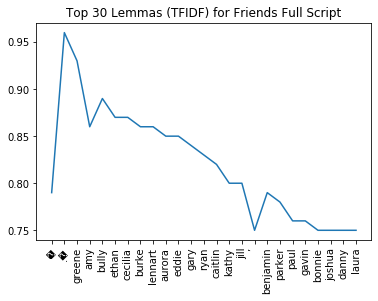

In [0]:
plot_top_tfidf(script_by_episode, 'Friends Full Script')

Unfortunately TFIDF seems to have backfired because the most common lemmas seem to be the names of secondary characters in the show, which is to be expected given that the full script includes the name of the speaker every time that individual speaks. To fix this, we would have to go through and remove all secondary character names. Nonetheless, since, for our purposes, it's not as important to identify how much they talk about body image but rather how they talk about it, let's move on to the word-specific analyses.

### Frequencies of Body Words - Full Series

In [0]:
# create a list of common body image-related terms to look for in the script
words = ["hottie", "sexy", "exercis", "waist", "busty", "fat ", "fatso ", 
         "fatty", "big boned", "big-boned", "flab", "binge", " pig ", "piggy", 
         "pig out", "lard ", "chunky", "weight", "skinny", " thin ", "healthy",
         "athletic", "saggy", "anorexic", "skeletal", "bag of bones", "diet"]

In [0]:
# create a list of compiled patterns to search for the words in "words"
patterns = [re.compile(x) for x in words]

In [0]:
# create function that searches for each of the patterns and returns a 
# rudolph list with all the strings where it found at least one of the patterns
rudolph = []
def red_nose(string):
    for i in patterns:
        if i.search(string) != None:
            rudolph.append(string)

In [0]:
# create function to plot frequency of each body word in a given series
def plot_basic_freq(Series, data_descriptor):
    # apply the red_nose function to get rudolph
    Series.apply(red_nose)
    # create a "match" list that goes through each item in rudolph and returns the match object found
    match = [re.search(pattern, string) for pattern in patterns for string in rudolph]
    # if there is a match object, return the actual word that was matched
    matched_words = [i.group(0) for i in match if i != None]
    # create tally_df with a count of how many times each word in words was matched in rudolph
    tally_df = pd.DataFrame({"Word": i, "Count": matched_words.count(i)} for i in words)
    # plot a histogram of each of the matched words
    tally_df.plot.bar(x = "Word", y = "Count", title = "Histogram of Matched Words for " + data_descriptor, legend = False);
    
    return

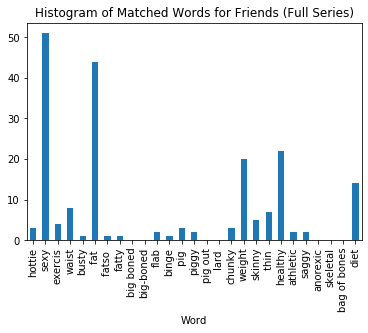

In [0]:
# plot a histogram of each of the body words
plot_basic_freq(df["Script"], "Friends (Full Series)")

Across the full series, it seems that the most common word by far was "sexy". This was followed by "fat", which was a lot more common than the next set of words. This next set was "healthy" and "weight" followed by "diet" and a final smattering of "waist", "thin", "skinny" followed by a small number of "hottie", "exercis", "busty", "fatso", "fatty", "flab", "binge", "pig", "piggy", "chunky", "athletic" and "saggy".

These preliminary analyses support those I ran with a subset of the script for assignment 2. In other words, sexy and fat seem to be overwhelmingly preponderant in comparison with the rest of the words, potentially implying that body image is seen as moving on a spectrum between these two extremes. This posits that fat is the direct opposite of sexy, which begins to formulate the potential cultural legisign that is being constructed here.

Additionally, the link in frequency between "healthy", "weight" and potentially "diet" seems to imply that these are being used together, perhaps demonstrating that weight and dieting are being referred to explicitly in contexts related to health, as opposed to more image-related contexts. Nonetheless, exercise is being referred to a lot less frequently than dieting, which implies that the show is giving more weight (get it?) to the latter as the way to achieve "health". 

"Thin", "skinny" and "waist" were also bound together in frequency of use and were arguably the third most common group of words used. This could imply that, even though "weight" was more tightly linked to "healthy", there is an underlying current of preoccupation with weight for the sake of being "skinny" and "thin". The fact that "waist", which is one of the more ambiguous words in the list (i.e. its use is less limited to body image), ocurred at a frequency close to that of "skinny" and "thin" might imply that this word is in fact being used in a body image context.

To dig deeper into these potential legisigns, let's take a look at what the words are being associated with specifically.

### Word2Vec - Full Series

In order to get as many of the body image words from the list above into the model vocab, I will set the min_count to 5.

In [20]:
corpus = df['Script'].apply(get_lemmas)
model = models.word2vec.Word2Vec(corpus, min_count=5, window=10, workers=8)
model.save('Friends_Full.model')
#model = models.KeyedVectors.load('Friends_Full.model')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


In [21]:
model.wv.vocab # b/c using gensim 10.0 need to include wv

{'nothing': <gensim.models.keyedvectors.Vocab at 0x7fa9172769e8>,
 'tell': <gensim.models.keyedvectors.Vocab at 0x7fa95b42a668>,
 'guy': <gensim.models.keyedvectors.Vocab at 0x7fa95b431b70>,
 'work': <gensim.models.keyedvectors.Vocab at 0x7fa917279cf8>,
 'c': <gensim.models.keyedvectors.Vocab at 0x7fa917279cc0>,
 'mon': <gensim.models.keyedvectors.Vocab at 0x7fa917279da0>,
 'go': <gensim.models.keyedvectors.Vocab at 0x7fa91728a208>,
 'gotta': <gensim.models.keyedvectors.Vocab at 0x7fa91728a160>,
 'something': <gensim.models.keyedvectors.Vocab at 0x7fa91728a3c8>,
 'wrong': <gensim.models.keyedvectors.Vocab at 0x7fa91728a438>,
 'right': <gensim.models.keyedvectors.Vocab at 0x7fa91728a278>,
 'joey': <gensim.models.keyedvectors.Vocab at 0x7fa91728a5c0>,
 'nice': <gensim.models.keyedvectors.Vocab at 0x7fa91728a630>,
 'hump': <gensim.models.keyedvectors.Vocab at 0x7fa91728a518>,
 'wait': <gensim.models.keyedvectors.Vocab at 0x7fa91728a668>,
 'eat': <gensim.models.keyedvectors.Vocab at 0x7fa9

Now let's look at the specific contexts these words are being used in:

In [22]:
print(model.most_similar('fat'))

[('cheese', 0.9969624280929565), ('smelly', 0.9967427253723145), ('us', 0.9966990947723389), ('cooky', 0.9965546131134033), ('kara', 0.9964419603347778), ('"!', 0.9964237213134766), ('cheek', 0.9964069724082947), ('tall', 0.9962408542633057), ('skate', 0.9962372779846191), ('butt', 0.9961421489715576)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


While fat was probably the word that I had the most faith in for being constantly related to body image, it seems that this is not always the case. The most consistent association instead seems to be with "smelly cheese". Eating smelly cheese makes you fat? Nonetheless, "cheek", "tall" and "butt" did come up as being commonly related, which might imply that fat is not being used to describe individuals (or at least not explicitly), but instead used to describe body parts. There is an association with a "Kara" who I am assumming to be a woman on the show, which might imply that it is sometimes used to describe people. 

In [23]:
print(model.most_similar('sexy'))

[('taste', 0.9986010789871216), ('silly', 0.9985403418540955), ('agent', 0.9983909130096436), ('scientist', 0.9983417987823486), ('loud', 0.998308002948761), ('responsibility', 0.9982138276100159), ('idiot', 0.9981100559234619), ('strong', 0.9980058670043945), ('prefer', 0.9979942440986633), ('forgive', 0.9979784488677979)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


The fact that "taste" was the most closely related word to "sexy" might imply that the latter is being used to objectify men or women (i.e. one likes "sexy" people, thus one has good "taste"). The link between "sexy" and "prefer" implies a direct normative judgement being imposed on the construct: sexy is preferred. The other associations are a bit more ambiguous. Does the association with "forgive" imply that sexiness is associated with some form of transgression and that, because of their sexiness they should be forgiven? This is line with the association with "idiot"; the sexy individual is an "idiot" who messed up and has to be "forgiven" as opposed to what might happen to them if they were not "sexy".

In [24]:
print(model.most_similar('healthy'))

[('teach', 0.9989075660705566), ('field', 0.998798668384552), ('treat', 0.9985904693603516), ('played', 0.9984585642814636), ('attractive', 0.9983638525009155), ('plus', 0.9982445240020752), ('past', 0.9981914162635803), ('beach', 0.9981844425201416), ('trip', 0.9981780052185059), ('top', 0.9981228709220886)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


This one is actually a bit more inspiring! It seems that "healthy" is being portrayed as "attractive"! The other associations seem to imply some form of exercise ("field", "played") and there is no association with "diet", which contradicts my previous interpretation based solely on frequency of word usage. 

In [25]:
print(model.most_similar('diet'))

[('disgust', 0.9975548982620239), ('issac', 0.9974499940872192), ('bastard', 0.9971832633018494), ('noo', 0.9970998764038086), ('nope', 0.9969691634178162), ('mattress', 0.9969664812088013), ('juice', 0.9969214200973511), ('beer', 0.9968675971031189), ('press', 0.9968500137329102), ('woo', 0.9968339204788208)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


Following from above, "diet" seems to be portrayed in pretty unambiguously negative terms ("disgust", "bastard", "noo", "nope") except for the "woo" outlier. This is pretty suprising given that I expected the show to really endorse the idea of dieting. On the other hand, a darker interpretation might be that the show endorses the idea that being thin is effortless, that its characters (who are constantly portrayed eating cookie dough and cheesecake off the floor) are inherently thin and that those who either do not look like them or have to actually work to obtain the body image the show is proposing as the "norm" are flawed.

In [26]:
print(model.most_similar('weight'))

[('cost', 0.998552143573761), ('color', 0.9984987378120422), ('top', 0.9984614849090576), ('ear', 0.9982758164405823), ('confident', 0.998031735420227), ('general', 0.9979500770568848), ('basically', 0.9979382753372192), ('heart', 0.997894287109375), ('read', 0.9978580474853516), ('dead', 0.9978517889976501)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


This one seems to have quite a bit of noise surrounding it. The only perhaps interpretable signals are "confident" and "heart", which seem to imply that a certain weight is associated with confidence and perhaps heart disease. Good for them for generating awareness about cardiovascular risk factors?

In [28]:
print(model.most_similar('thin'))

[('pitch', 0.9953467845916748), ('taped', 0.9952932000160217), ('swedish', 0.9952793121337891), ('unbelievable', 0.995253324508667), ('ups', 0.9950617551803589), ('"?', 0.9949877262115479), ('gift', 0.99495929479599), ('speaker', 0.9948835372924805), ('stuffed', 0.9948090314865112), ('floss', 0.9947777390480042)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


Likewise, this one is perhaps even more noisy. Swedish people are thin? Being thin is "unbelievable" and a "gift"?

In [29]:
print(model.most_similar('waist'))

[('deny', 0.9851607084274292), ('tweet', 0.9796579480171204), ('meddle', 0.9762008190155029), ('flat', 0.9761043787002563), ('receive', 0.9755796790122986), ('worn', 0.9746367931365967), ('mac', 0.9745659828186035), ('transcribed', 0.9744442701339722), ('chi', 0.9741026163101196), ('500', 0.9738297462463379)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


Very few interpretable associations here as well. This was before twitter, so "tweet" seems nonsensical. A "flat" waist seems to be the only body related association. Let's also look at some words that were not in the original list of body image words due to their potential to be used in a non-body image-related context:

In [30]:
print(model.most_similar('chubby'))

[('perfectly', 0.9920852184295654), ('wonderful', 0.9920382499694824), ('bond', 0.9916990995407104), ('awful', 0.9915071725845337), ('horrible', 0.9911754131317139), ('tear', 0.9911019802093506), ('attract', 0.991065502166748), ('poetry', 0.991019606590271), ('richard', 0.9909066557884216), ('grown', 0.9904427528381348)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


This one seems to be quite interesting! "Chubby" can be "wonderful", "awful", "horrible", "poetry" and it can "attract". This lack of a clear positive vs. negative judgement of being chubby might be due to the fact that the valence of the association with chubby depends on the gender of the chubby individual. The fact that "Richard" came up might be evidence of this hypothesis, suggesting that "chubby" is being used in very specific contexts to refer differently to different people. I hypothesize that males would be regarded as "perfectly chubby" while female chubbiness would be seen as "awful" and "horrible".

In [33]:
print(model.most_similar('monica'))

[('chandler', 0.9937478303909302), ('rachel', 0.9551491737365723), ('ross', 0.9474140405654907), ('julie', 0.9407965540885925), ('karen', 0.939868152141571), ('green', 0.939266562461853), ('phoebe', 0.9335882663726807), ('aunt', 0.9300917387008667), ('sweetie', 0.9278972148895264), ('joanne', 0.9269741773605347)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


With this one, I wanted to test whether Monica's identity was being primarily determined by body or weight related constructs. It is pretty clear that this is not the case.

In [34]:
print(model.most_similar('fit'))

[('except', 0.998707115650177), ('enjoy', 0.9985222816467285), ('shame', 0.9983038306236267), ('adopt', 0.9982916116714478), ('voice', 0.998115599155426), ('dead', 0.9980870485305786), ('physically', 0.9980694651603699), ('skin', 0.9980660676956177), ('broke', 0.9979838132858276), ('read', 0.9978092908859253)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


This one is a bit ambiguous. Being "fit" is seen as something one can "enjoy" (presumably enjoying exercise?) or something that causes "shame". It does seem clear, though, that fit is commonly used in a body image context due to the associaton with "physically". The association with "shame" could be seen as being in line with the interpretation that having to work to fit the body image norm imposed by the show is a negative thing that people should be ashamed of.

In [35]:
print(model.most_similar('butt'))

[('white', 0.9985634684562683), ('tree', 0.9985139966011047), ('fish', 0.9984838962554932), ('cheese', 0.9982281923294067), ('breast', 0.9980848431587219), ('full', 0.9979795217514038), ('gun', 0.9978420734405518), ('horse', 0.9977140426635742), ('pink', 0.9975488781929016), ('teeth', 0.9975028038024902)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


This one was a bit of a stretch to try and see whether butts would be related to the physical objectification of the body. I don't really want to think too much about what some of these associations might mean ("horse"?!? "fish"? "tree"?) but it does seem that "breast"s are associated with butts, and that a "full" butt is something that is generally talked about, though there seems to be no normative judgement about whether a full vs. non-full butt is preferred.

In [39]:
print(model.most_similar('hot'))

[('cowboy', 0.9957091808319092), ('small', 0.9955188632011414), ('naked', 0.9951808452606201), ('memory', 0.9949090480804443), ('tough', 0.9949041604995728), ('healthy', 0.9949008226394653), ('field', 0.9948377013206482), ('bunch', 0.9948168396949768), ('catalog', 0.9946032166481018), ('fool', 0.9942383766174316)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


It does seem to be clear that "hot" is being used to refer almost exclusively to people in a body image context. One surprising implication is that "healthy" is "hot"! Another redeeming finding! Additionally, a "hot" "fool" might be a parallel finding to that of the "sexy" "idiot". Finally, the fact that the show seems to constantly talk about a "catalog" of a "bunch" of "hot" people (presumably girls) might support the idea that there is at least some objectification being endorsed by the show.

In [40]:
print(model.most_similar('beautiful'))

[('incredible', 0.9928116798400879), ('cute', 0.9923517107963562), ('smart', 0.9897598028182983), ('sooo', 0.9892964363098145), ('fantastic', 0.988322913646698), ('jerk', 0.988161563873291), ('strength', 0.9874805212020874), ('cuter', 0.9864382147789001), ('amaze', 0.985974907875061), ('sweet', 0.9854568243026733)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


Another redeeming finding! "Beautiful" does not seem to be related to any specific form of body image. Instead, it was associated with "smart"! How exciting!

In [36]:
print(model.most_similar('woman'))

[('old', 0.9630957841873169), ('every', 0.9597954750061035), ('spend', 0.9597305059432983), ('closeness', 0.9589099884033203), ('life', 0.9538546800613403), ('whole', 0.9519376158714294), ('family', 0.9506732821464539), ('hardest', 0.9505895972251892), ('strike', 0.9503380656242371), ('girl', 0.9448812007904053)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


I find this one to be particularly awesome. It seems that women are being spoken about in the context of emotional "closeness" and "life"-long relationships to build  "family", as opposed to a body image or objectifying context. 

In [37]:
print(model.most_similar('men'))

[('dry', 0.9978958368301392), ('basket', 0.9977803230285645), ('experience', 0.997673749923706), ('center', 0.9975926876068115), ('potato', 0.9975906014442444), ('video', 0.9975890517234802), ('lead', 0.9975513219833374), ('boat', 0.9974918365478516), ('monkey', 0.9974718689918518), ('toe', 0.9974619150161743)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


This one is a bit harder to interpret. While clear that men are not being talked about in a body image context, apparently they are "potato"es and "monkey"s that "lead" and maybe own "boat"s. Not quite sure.

In [38]:
print(model.most_similar('girl'))

[('small', 0.9883091449737549), ('19', 0.9879047870635986), ('lousy', 0.9870787858963013), ('wear', 0.9869669675827026), ('hot', 0.9868993759155273), ('eats', 0.9868943691253662), ('consummate', 0.9865750074386597), ('fool', 0.9861144423484802), ('"...', 0.9860670566558838), ('us', 0.9859635233879089)]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


While I was really excited about the "woman" findings, I did have a feeling that instead of reflecting the general way of speaking about females, it was reflecting only one of the ways that females are talked about. I set out to test this idea in this set of associations. Unfortunately, my fears have been confirmed. When females are talked about as girls, the focus is on them being "small" (although presumably this could be reflecting age as opposed to body proportions), what they "wear" and "eat" as well as them being "hot". The reference to "us", while a bit of a stretch, could be particularly concerning because it might imply that it is the women in the show who are talking about themselves in this way. I am quite disappointed by the show, not going to lie.

All in all, it seems that a couple interesting (though not very reassuring) conclusions can be drawn. First, body image is definitely something that is being talked about in the show, both explicitly and implicitly. Second, and perhaps most importantly, the way that body image is talked about depends on who the object of the conversation is and what gender they are. Not surprisingly, different body image expectations seem to exist for males and females, and there seems to be more variability and perhaps more objectification in the way that female body image is talked about. Now let's move on to seeing how different characters, especially males vs. females, talk about body image.

### Speaker Analyses

In [0]:
# create individual pd Series for each speaker as well as female vs. male
Joey = pd.Series(df["Script"][df["Speaker"] == "joey"])
Chandler = pd.Series(df["Script"][df["Speaker"] == "chandler"])
Ross = pd.Series(df["Script"][df["Speaker"] == "ross"])
Rachel = pd.Series(df["Script"][df["Speaker"] == "rachel"])
Monica = pd.Series(df["Script"][df["Speaker"] == "monica"])
Phoebe = pd.Series(df["Script"][df["Speaker"] == "phoebe"])
boyz = pd.Series(df["Script"][(df["Speaker"] == "joey") | (df["Speaker"] == "ross") | (df["Speaker"] == "chandler")])
girlz = pd.Series(df["Script"][(df["Speaker"] == "rachel") | (df["Speaker"] == "monica") | (df["Speaker"] == "phoebe")])

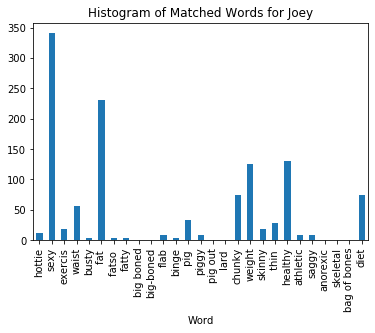

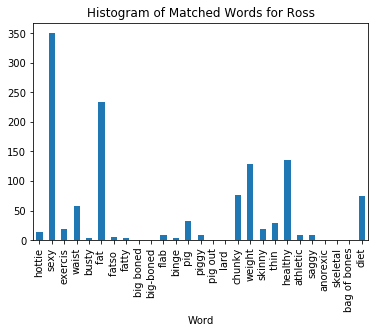

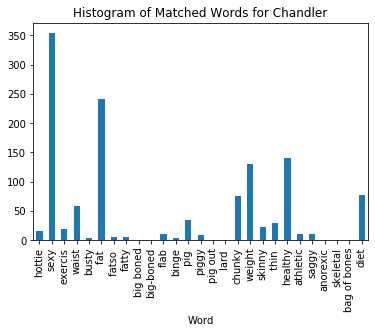

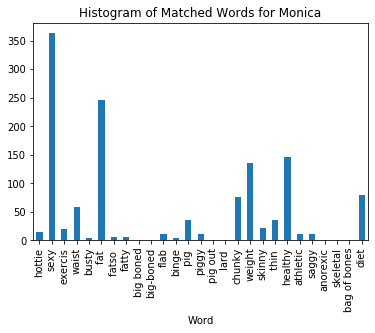

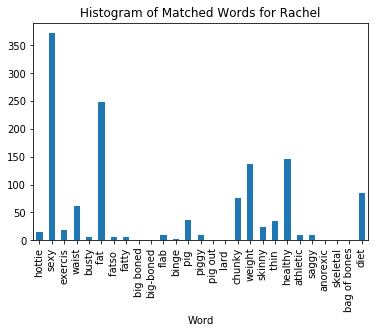

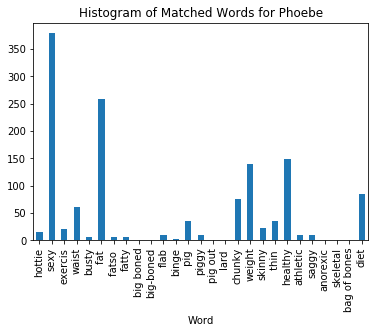

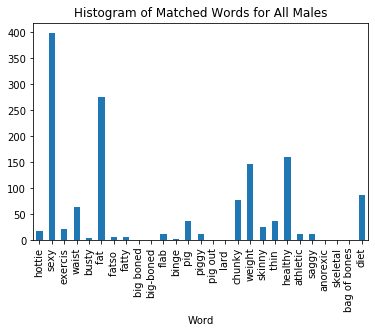

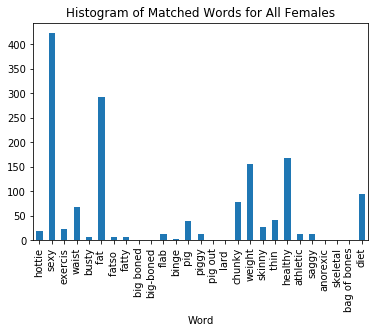

In [0]:
plot_basic_freq(Joey, "Joey")
plot_basic_freq(Ross, "Ross")
plot_basic_freq(Chandler, "Chandler")
plot_basic_freq(Monica, "Monica")
plot_basic_freq(Rachel, "Rachel")
plot_basic_freq(Phoebe, "Phoebe")
plot_basic_freq(boyz, "All Males")
plot_basic_freq(girlz, "All Females")

In [0]:
# create a function to get tallies for body words in a given series
def get_tallies(Series, descriptor):
    # apply the red_nose function to get rudolph
    Series.apply(red_nose)
    # create a "match" list that goes through each item in rudolph and returns the match object found
    match = [re.search(pattern, string) for pattern in patterns for string in rudolph]
    # if there is a match object, return the actual word that was matched
    matched_words = [i.group(0) for i in match if i != None]
    # create tally_df with a count of how many times each word in words was matched in rudolph
    tally_df = pd.DataFrame({"Word": i, descriptor : matched_words.count(i)} for i in words)
    
    return tally_df

In [0]:
# apply the tally function to each speaker script
tallies_joey = get_tallies(Joey, "Joey")
tallies_ross = get_tallies(Ross, "Ross")
tallies_chandler = get_tallies(Chandler, "Chandler")
tallies_monica = get_tallies(Monica, "Monica")
tallies_rachel = get_tallies(Rachel, "Rachel")
tallies_phoebe = get_tallies(Phoebe, "Phoebe")
tallies_boyz = get_tallies(boyz, "All Males")
tallies_girlz = get_tallies(girlz, "All Females")

In [0]:
# make a list of the dataframes
speaker_tallies = [tallies_joey, tallies_ross, tallies_chandler, tallies_monica, tallies_rachel,
                             tallies_phoebe, tallies_boyz, tallies_girlz]

In [0]:
# merge the dataframes by the common column (Word)
tallies_by_speaker = reduce(lambda left,right: pd.merge(left,right,on='Word'), speaker_tallies)

In [0]:
tallies_by_speaker

,Word,Joey,Ross,Chandler,Monica,Rachel,Phoebe,All Males,All Females
0,hottie,24,26,27,27,27,27,30,30
1,sexy,517,526,530,539,548,555,574,599
2,exercis,31,31,31,31,31,32,34,35
3,waist,80,81,82,83,85,85,88,91
4,busty,8,8,8,8,9,9,9,10
5,fat,367,370,377,382,385,394,411,428
6,fatso,8,9,9,9,9,9,10,10
7,fatty,8,8,9,9,9,9,10,10
8,big boned,0,0,0,0,0,0,0,0
9,big-boned,0,0,0,0,0,0,0,0


In [0]:
# reformat the dataframe and only include words that were used a lot
final_tallies = pd.DataFrame({"Sexy": tallies_by_speaker.iloc[1], "Fat": tallies_by_speaker.iloc[5], 
                              "Waist": tallies_by_speaker.iloc[3], "Chunky": tallies_by_speaker.iloc[16],
                              "Weight": tallies_by_speaker.iloc[17], "Healthy": tallies_by_speaker.iloc[20],
                              "Diet": tallies_by_speaker.iloc[26]}, index = None)
final_tallies

,Sexy,Fat,Waist,Chunky,Weight,Healthy,Diet
Word,sexy,fat,waist,chunky,weight,healthy,diet
Joey,517,367,80,82,193,207,115
Ross,526,370,81,84,197,211,115
Chandler,530,377,82,84,198,217,117
Monica,539,382,83,84,204,221,119
Rachel,548,385,85,84,205,222,124
Phoebe,555,394,85,84,207,224,124
All Males,574,411,88,86,215,236,127
All Females,599,428,91,86,224,243,134


In [0]:
# drop the first row
final_tallies = final_tallies.drop("Word", axis = 0)

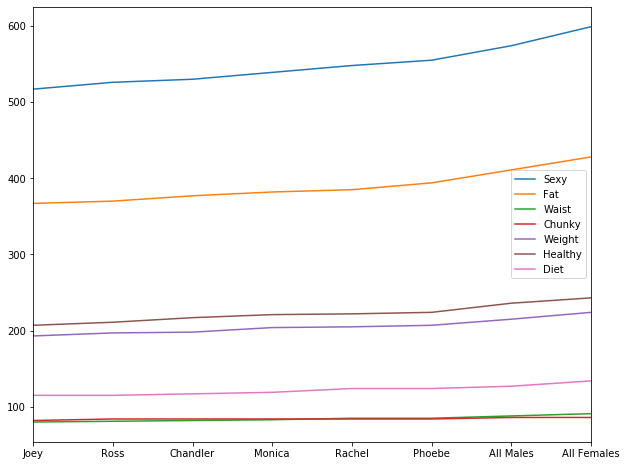

In [0]:
# make a beautiful line plot
final_tallies.plot.line(figsize = (10, 8));

Wow! Lots of surprising findings here. First of all, while Joey embodies the stereotype of the womanizer, the don juan, the lone wolf who sleeps around and never calls them back the next day, he is actually the one who uses these body image words the least! This might be an attempt by the authors to not go overboard with the stereotype by having only his actions, as opposed to his words, express it. 

The most concerning finding, though, is the fact that the women seem to employ this body image language a lot more than the men. This is true for all the individual characters as well as for the combined categories of female vs. male speakers. This is particularly true for "sexy" and "fat".

### Analysis by Season

In [0]:
# pull the second anchors into a dictionary of seasons
seasons = {"Season_"+ str(second_anchors.index(i)+1): i for i in second_anchors}
seasons["Season_3"]

[<a href="season/0301.html">301 The Princess Leia Fantasy </a>,
 <a href="season/0302.html">302 No One's Ready</a>,
 <a href="season/0303.html">303 The Jam</a>,
 <a href="season/0304.html">304 The Metaphorical Tunnel</a>,
 <a href="season/0305.html">305 Frank Jr.</a>,
 <a href="season/0306.html">306 The Flashback</a>,
 <a href="season/0307.html">307 The Race Car Bed</a>,
 <a href="season/0308.html">308 The Giant Poking Device</a>,
 <a href="season/0309.html">309 The Football</a>,
 <a href="season/0310.html">310 Rachel Quits</a>,
 <a href="season/0311.html">311 Chandler Can't Remember Which Sister</a>,
 <a href="season/0312.html">312 All The Jealousy</a>,
 <a href="season/0313.html">313 Monica And Richard Are Just Friends</a>,
 <a href="season/0314.html">314 Phoebe's Ex-Partner</a>,
 <a href="season/0315.html">315 Ross And Rachel Take A Break</a>,
 <a href="season/0316.html">316 The Morning After</a>,
 <a href="season/0317.html">317 The Ski Trip</a>,
 <a href="season/0318.html">318 The 

In [0]:
# make a list of the season names
season_names = list(seasons.keys())
season_names

['Season_1',
 'Season_2',
 'Season_3',
 'Season_4',
 'Season_5',
 'Season_6',
 'Season_7',
 'Season_8',
 'Season_9',
 'Season_10']

In [0]:
# get the links for each season and put them into a season dictionary
season_links = {season: ["https://fangj.github.io/friends/" + i.get('href') for i in seasons[season]] for season in seasons}
season_links["Season_3"]

['https://fangj.github.io/friends/season/0301.html',
 'https://fangj.github.io/friends/season/0302.html',
 'https://fangj.github.io/friends/season/0303.html',
 'https://fangj.github.io/friends/season/0304.html',
 'https://fangj.github.io/friends/season/0305.html',
 'https://fangj.github.io/friends/season/0306.html',
 'https://fangj.github.io/friends/season/0307.html',
 'https://fangj.github.io/friends/season/0308.html',
 'https://fangj.github.io/friends/season/0309.html',
 'https://fangj.github.io/friends/season/0310.html',
 'https://fangj.github.io/friends/season/0311.html',
 'https://fangj.github.io/friends/season/0312.html',
 'https://fangj.github.io/friends/season/0313.html',
 'https://fangj.github.io/friends/season/0314.html',
 'https://fangj.github.io/friends/season/0315.html',
 'https://fangj.github.io/friends/season/0316.html',
 'https://fangj.github.io/friends/season/0317.html',
 'https://fangj.github.io/friends/season/0318.html',
 'https://fangj.github.io/friends/season/0319.

In [0]:
# dictionary for season htmls
season_htmls = {season: [requests.get(i) for i in season_links[season]] for season in seasons}

In [0]:
# dictionary for season soups
season_soups = {season: [BeautifulSoup(i.text, "html.parser") for i in season_htmls[season]] for season in seasons}
season_soups["Season_3"]

[<html>
 <head>
 <title>The One With the Princess Leia Fantasy</title>
 </head>
 <body alink="yellow" bgcolor="white" link="green" text="black" vlink="black">
 <h1 align="center">The One With the Princess Leia Fantasy</h1>
 <hr/>
 <i>
 <p></p></i>Written by: Michael Curtis and Gregory S. Malins<br/>
 Transcribed by: <a href="mailto:Ericaasen1@aol.com">Eric Aasen</a> </body></html>
 <hr/>
 <font size="3">
 <p align="left">[Scene Central Perk, the whole gang is entering]</p>
 <p><b>Joey:</b> I'm tellin' ya that girl totally winked at me.</p>
 <p><b>All:</b> Did not, she did not wink at you...(sees that their sacred couch is
 occupied by strangers).</p>
 <p><b>Chandler:</b> Huh. (They all leave, dejected)</p>
 <p align="center"><strong>Opening Credits</strong></p>
 <p>[Scene: Rachel and Monica's, Phoebe, Ross, and Rachel are eating breakfast.]</p>
 <p><b>Ross:</b> I have to say <em>Tupolo Honey</em> by Van Morrison.</p>
 <p><b>Rachel:</b> Nooo Way! The most romantic song ever is <em>The W

In [0]:
# dictionary for season lines
season_lines = {season: [i.find_all('p') for i in season_soups[season]] for season in seasons}
season_lines["Season_3"]

[[<p></p>,
  <p align="left">[Scene Central Perk, the whole gang is entering]</p>,
  <p><b>Joey:</b> I'm tellin' ya that girl totally winked at me.</p>,
  <p><b>All:</b> Did not, she did not wink at you...(sees that their sacred couch is
  occupied by strangers).</p>,
  <p><b>Chandler:</b> Huh. (They all leave, dejected)</p>,
  <p align="center"><strong>Opening Credits</strong></p>,
  <p>[Scene: Rachel and Monica's, Phoebe, Ross, and Rachel are eating breakfast.]</p>,
  <p><b>Ross:</b> I have to say <em>Tupolo Honey</em> by Van Morrison.</p>,
  <p><b>Rachel:</b> Nooo Way! The most romantic song ever is <em>The Way We Were</em>.</p>,
  <p><b>Phoebe:</b> See, I-I think that one that Elton John wrote for, um, that guy on <em>Who's
  The Boss</em>.</p>,
  <p><b>Rachel:</b> What song was that, Pheebs?</p>,
  <p><b>Phoebe:</b> (singing) <em>Hold me close, young Tony Dan-za</em>.</p>,
  <p>(Monica enters from her bedroom)</p>,
  <p><b>Phoebe:</b> Hi Monica!</p>,
  <p><b>Ross:</b> Hey Mon!</p>

In [0]:
# dictionary for unlisted lines for each season
season_flat_lines = {season: [item for sublist in season_lines[season] for item in sublist] for season in seasons}
season_flat_lines["Season_3"]

[<p></p>,
 <p align="left">[Scene Central Perk, the whole gang is entering]</p>,
 <p><b>Joey:</b> I'm tellin' ya that girl totally winked at me.</p>,
 <p><b>All:</b> Did not, she did not wink at you...(sees that their sacred couch is
 occupied by strangers).</p>,
 <p><b>Chandler:</b> Huh. (They all leave, dejected)</p>,
 <p align="center"><strong>Opening Credits</strong></p>,
 <p>[Scene: Rachel and Monica's, Phoebe, Ross, and Rachel are eating breakfast.]</p>,
 <p><b>Ross:</b> I have to say <em>Tupolo Honey</em> by Van Morrison.</p>,
 <p><b>Rachel:</b> Nooo Way! The most romantic song ever is <em>The Way We Were</em>.</p>,
 <p><b>Phoebe:</b> See, I-I think that one that Elton John wrote for, um, that guy on <em>Who's
 The Boss</em>.</p>,
 <p><b>Rachel:</b> What song was that, Pheebs?</p>,
 <p><b>Phoebe:</b> (singing) <em>Hold me close, young Tony Dan-za</em>.</p>,
 <p>(Monica enters from her bedroom)</p>,
 <p><b>Phoebe:</b> Hi Monica!</p>,
 <p><b>Ross:</b> Hey Mon!</p>,
 <p><b>Rachel:<

In [0]:
# finally, a dictionary of the script for each season
season_list_script = {season: [i.get_text() for i in season_flat_lines[season]] for season in seasons}
season_list_script["Season_3"]

['',
 '[Scene Central Perk, the whole gang is entering]',
 "Joey: I'm tellin' ya that girl totally winked at me.",
 'All: Did not, she did not wink at you...(sees that their sacred couch is\noccupied by strangers).',
 'Chandler: Huh. (They all leave, dejected)',
 'Opening Credits',
 "[Scene: Rachel and Monica's, Phoebe, Ross, and Rachel are eating breakfast.]",
 'Ross: I have to say Tupolo Honey by Van Morrison.',
 'Rachel: Nooo Way! The most romantic song ever is The Way We Were.',
 "Phoebe: See, I-I think that one that Elton John wrote for, um, that guy on Who's\nThe Boss.",
 'Rachel: What song was that, Pheebs?',
 'Phoebe: (singing) Hold me close, young Tony Dan-za.',
 '(Monica enters from her bedroom)',
 'Phoebe: Hi Monica!',
 'Ross: Hey Mon!',
 'Rachel: Hey Mon!',
 '(she just walks straight into the bathroom)',
 'Phoebe: Oh my God, has she slept at all?',
 'Ross: Nope.',
 "Rachel: No, it's been three nights in a row.",
 "Ross: Yeah, she finally stopped crying yesterday, but then s

In [0]:
# make ten different dfs - one for each season
df_Season_1 = pd.DataFrame(season_list_script["Season_1"], columns = ["Original"])
df_Season_2 = pd.DataFrame(season_list_script["Season_2"], columns = ["Original"])
df_Season_3 = pd.DataFrame(season_list_script["Season_3"], columns = ["Original"])
df_Season_4 = pd.DataFrame(season_list_script["Season_4"], columns = ["Original"])
df_Season_5 = pd.DataFrame(season_list_script["Season_5"], columns = ["Original"])
df_Season_6 = pd.DataFrame(season_list_script["Season_6"], columns = ["Original"])
df_Season_7 = pd.DataFrame(season_list_script["Season_7"], columns = ["Original"])
df_Season_8 = pd.DataFrame(season_list_script["Season_8"], columns = ["Original"])
df_Season_9 = pd.DataFrame(season_list_script["Season_9"], columns = ["Original"])
df_Season_10 = pd.DataFrame(season_list_script["Season_10"], columns = ["Original"])

In [0]:
# clean each one of the dataframes
df_Season_1 = bubbles_n_suds(df_Season_1)
df_Season_2 = bubbles_n_suds(df_Season_2)
df_Season_3 = bubbles_n_suds(df_Season_3)
df_Season_4 = bubbles_n_suds(df_Season_4)
df_Season_5 = bubbles_n_suds(df_Season_5)
df_Season_6 = bubbles_n_suds(df_Season_6)
df_Season_7 = bubbles_n_suds(df_Season_7)
df_Season_8 = bubbles_n_suds(df_Season_8)
df_Season_9 = bubbles_n_suds(df_Season_9)
df_Season_10 = bubbles_n_suds(df_Season_10)

In [0]:
df_list = [df_Season_1, df_Season_2, df_Season_3, df_Season_4, df_Season_5, df_Season_6, df_Season_7, df_Season_8, df_Season_9, df_Season_10]

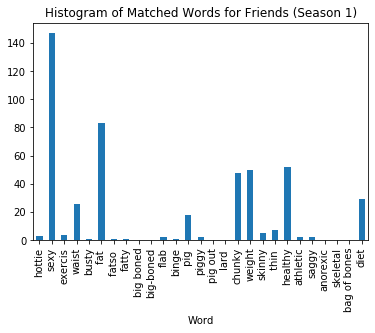

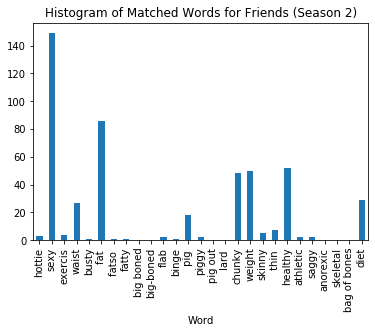

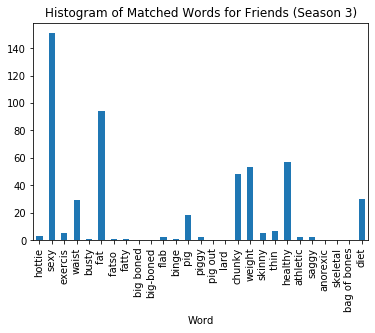

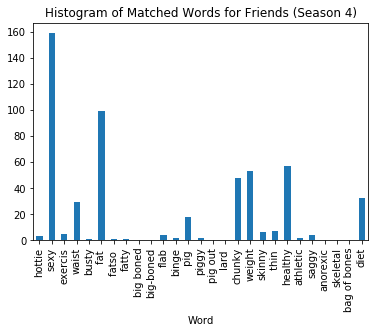

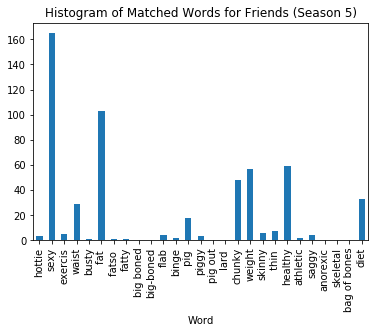

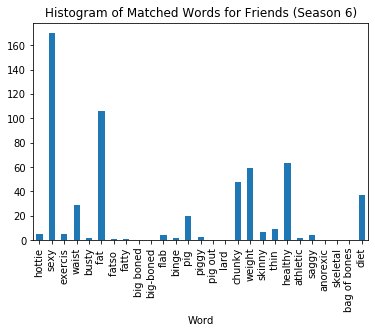

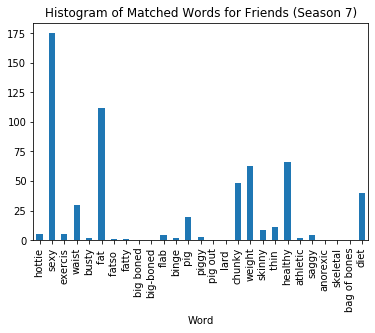

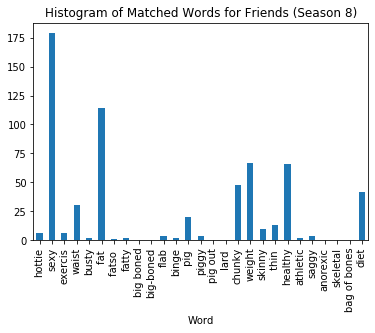

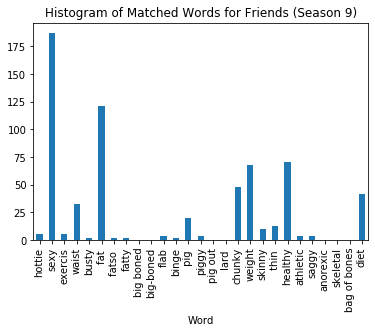

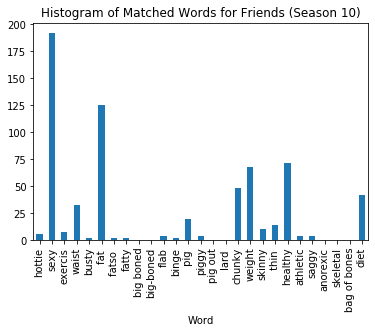

In [0]:
# plot a histogram of body word usage for each season
plot_basic_freq(df_Season_1["Script"], "Friends (Season 1)")
plot_basic_freq(df_Season_2["Script"], "Friends (Season 2)")
plot_basic_freq(df_Season_3["Script"], "Friends (Season 3)")
plot_basic_freq(df_Season_4["Script"], "Friends (Season 4)")
plot_basic_freq(df_Season_5["Script"], "Friends (Season 5)")
plot_basic_freq(df_Season_6["Script"], "Friends (Season 6)")
plot_basic_freq(df_Season_7["Script"], "Friends (Season 7)")
plot_basic_freq(df_Season_8["Script"], "Friends (Season 8)")
plot_basic_freq(df_Season_9["Script"], "Friends (Season 9)")
plot_basic_freq(df_Season_10["Script"], "Friends (Season 10)")

In [0]:
# apply the tally function to each season script
tallies_S1 = get_tallies(df_Season_1["Script"], "Season 1")
tallies_S2 = get_tallies(df_Season_2["Script"], "Season 2")
tallies_S3 = get_tallies(df_Season_3["Script"], "Season 3")
tallies_S4 = get_tallies(df_Season_4["Script"], "Season 4")
tallies_S5 = get_tallies(df_Season_5["Script"], "Season 5")
tallies_S6 = get_tallies(df_Season_6["Script"], "Season 6")
tallies_S7 = get_tallies(df_Season_7["Script"], "Season 7")
tallies_S8 = get_tallies(df_Season_8["Script"], "Season 8")
tallies_S9 = get_tallies(df_Season_9["Script"], "Season 9")
tallies_S10 = get_tallies(df_Season_10["Script"], "Season 10")

In [0]:
# make a list of the dataframes
all_the_tallies = [tallies_S1, tallies_S2, tallies_S3, tallies_S4, tallies_S5,
                             tallies_S6, tallies_S7, tallies_S8, tallies_S9, tallies_S10]

In [0]:
# merge the dataframes by the common column (Word)
tallies_by_season = reduce(lambda left,right: pd.merge(left,right,on='Word'), all_the_tallies)

In [0]:
tallies_by_season

,Word,Season 1,Season 2,Season 3,Season 4,Season 5,Season 6,Season 7,Season 8,Season 9,Season 10
0,hottie,6,6,6,6,6,8,8,9,9,9
1,sexy,240,242,244,252,258,263,268,272,280,285
2,exercis,8,8,9,9,9,9,9,10,10,12
3,waist,41,42,44,44,44,44,45,45,48,48
4,busty,2,2,2,2,2,3,3,3,3,3
5,fat,141,144,152,157,161,164,170,172,179,183
6,fatso,2,2,2,2,2,2,2,2,3,3
7,fatty,2,2,2,2,2,2,2,3,3,3
8,big boned,0,0,0,0,0,0,0,0,0,0
9,big-boned,0,0,0,0,0,0,0,0,0,0


In [0]:
# reformat the dataframe and only include words that were used a lot
final_tallies = pd.DataFrame({"Sexy": tallies_by_season.iloc[1], "Fat": tallies_by_season.iloc[5], 
                              "Pig": tallies_by_season.iloc[12], "Chunky": tallies_by_season.iloc[16],
                              "Weight": tallies_by_season.iloc[17], "Healthy": tallies_by_season.iloc[20],
                              "Diet": tallies_by_season.iloc[26]}, index = None)
final_tallies

,Sexy,Fat,Pig,Chunky,Weight,Healthy,Diet
Word,sexy,fat,pig,chunky,weight,healthy,diet
Season 1,240,141,28,72,84,88,50
Season 2,242,144,28,72,84,88,50
Season 3,244,152,28,72,87,93,51
Season 4,252,157,28,72,87,93,53
Season 5,258,161,28,72,91,95,54
Season 6,263,164,30,72,93,99,58
Season 7,268,170,30,72,97,102,61
Season 8,272,172,30,72,101,102,63
Season 9,280,179,30,72,102,107,63


In [0]:
# drop the first row
final_tallies = final_tallies.drop("Word", axis = 0)

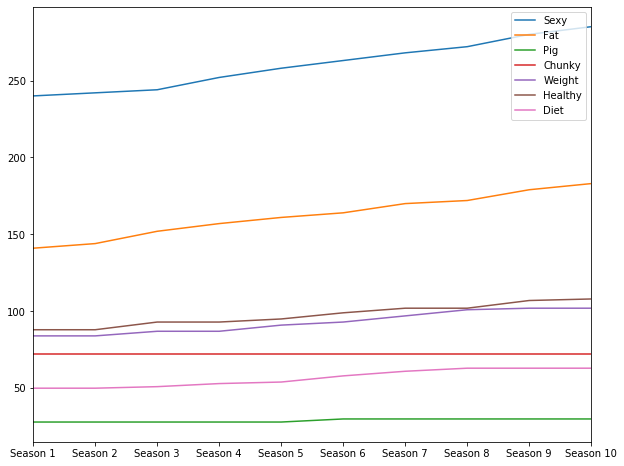

In [0]:
# make a beautiful line plot
final_tallies.plot.line(figsize = (10, 8));

Once more, pretty suprising findings! I had expected that, with the increase in feminist movement penetration in the media as well as the rise in political correctness through the decade that Friends ran for, the use of these terms would have decreased. Instead, we see a very consistent gradual increase in the use of the terms by season. This is especially true for "sexy" and "fat", which have the steepest upward slopes of all the words. "Pig" and "chunky" seem to have stayed constant through the decade. "Diet" and "weight" increased gradually up until season 8, then plateaued up to season 10.

# Discussion

To briefly summarize the findings as analyzed above, it seems that there is a specific and consistent way that body image image is talked about in the show. There seems to be objectification going on and the way that body image is talked about depends not only on gender but, specifically for women, how the the person is conceived (e.g. woman vs. girl). Surprisingly, female characters used this language more often and overall frequency of use gradually increased through the decade that Friends ran for. 

The approach to the analyses was generally quite effective. While TFIDF did not provide any insight into how much body image was talked about, following the basic frequency analyses with word2vec was instrumental in discovering the more essential question: how the show discusses body image. Word2vec allowed us to really dig deep in order to identify not only whether the presumed body image words were actually being used in a body image context, but how exactly this context was being discussed. Primarily, this allowed us to find cases of clear normative judgements about specific aspects of body image (e.g. dieting is bad). Furthermore, analyzing the use of these words by speaker and season provided insight into not only how these associations were being formed but how they were being maintained.

The sign conventions analyzed above seem to be maintained mostly through their repeated use by female speakers in the show. It is also clear that these legisigns are not only being maintained throughout the whole running of the show, but are actually being reinforced further through an increased use of the body image words. These legisigns are affecting a huge variety of cultural groups worldwide. Not only was Friends one of the most popular shows of all time, but the Wikipedia article (where I got this "statistic") even has a section devoted to psychology studies exploring the effect of this show on culture.

One social science theory that might help us understand this pattern of findings is the conceptualization of body image as a form of fashion. As Finkelstein stated, "The body is always a communication system" (Finkelstein, 126) and fashion is "a visible marker of identity, status, and gender" (Finkelstein, 127). This has multiple implications for our findings. In its "significance as a language conveying cultural tastes and distinctions between social levels or classes" (Finkelstein, 127), the specific legisigns generated by "Friends" can be seen as markers for the creation of a new social class: the young, skinny, hip New Yorkers that at the same time live an idealized life while still being relatable for the general public. "I could be Monica! After all, she lost all that weight and now she is beautiful and lives in New York City and has great friends!" In this sense, body image in the show can be used to enforce conformity to the norm they are setting. It can be seen as a form of "uniforms and set styles of clothing" that have "become identified with specific occupations, gender, and status" (Finkelstein, 127). This uniformity in body image, especially when considering both the way the characters look and the overwhelming frequency of use of the word "sexy", is a very specific legisign that says to its consumers: if you can't conform to this body image, you will never belong to this class of young, hip New Yorkers". Likewise, Benstock and Ferriss talk about the role of fashion in enforcing "a 'normative' ideal of femininity" (Benstock and Ferriss, 9). This, in combination with the uniformity and forced conformity discussed above, brings to mind the discussion of the Barbie doll in the toy industry. Benstock and Ferriss point out the "tactics employed by the beauty industry to subject the female form to its control" (Benstock and Ferriss, 9). 

Nonetheless, this interpretation might predict that, in a very Foucaultian sense, women are being forced into this norm by an external force, presumably a male power. In their discussion of photography and film, Benstock and Ferriss equate the camera with the "masculine gaze" (Benstock and Ferriss, 11). Similarly, they talk about "the painful sense of being stripped naked by the (masculine) gaze" (Benstock and Ferriss, 13). Based on the data, particularly the analyses by individual speaker and by females vs. males, I would argue that this legisign — the endorsing of conformity to a female 'norm' — is very much being maintained by female speakers. This self-subjugation, then, I argue is a result of the show promoting body image-related co-rumination and 'fat-talk'.

Fat-talk has been defined as "women (typically peers) engaging in mutual disparagement about the size and shape of their bodies" (Salk and Engeln-Maddox, 2011). Similarly, co-rumination is "the excessive discussion of problems within the interpersonal context" (Dishion and Tipsord, 2011). Interestingly, increased fat-talk was found to increase body image dissatisfaction only in women on the lower end of the weight spectrum (as, coincidentally, Monica, Rachel and Phoebe very much are) (Chow, Hart and Tan, 2019). In a review of the literature, Dishion and Tipsord found substantive support for the idea that co-rumination is not only associated with increased internalizing (i.e. depression and anxiety) symptoms in girls, but may also be a potential mechanism underlying the relationship between peer contagion and depressive symptoms in adolescence and childhood (2011). Based on this research, I would argue that co-rumination and fat-talk can explain the somewhat surprising findings that female characters are the main force maintaining the body image legisigns in the show. As stated in the analyses-by-speaker section, not only did each individual female character use the body image words more frequently than each individual male character, but as a combined group, females used the words more than males, and this was especially true for "fat" and "sexy". I believe this reflects two levels of legisign propagation by the show. First, based on the non-gendered analyses, there are specific legisigns about body image that are being generated by the show. Second, and perhaps more damagingly, fat-talk and co-rumination in females is a second-order legisign that is also being generated and maintained by the show.



# Conclusion

This analysis sought to examine how the TV show Friends talks about body image in order to determine whether any specific cultural legisigns were being generated, promoted and/or maintained. From these findings, it seems clear that several specific legisigns were conventionalized throughout the show. First, a potential dichotomy exists in the show between "sexy" and "fat". Second, the way that body image is talked about depends on the gender and identity of the person who the body belongs to. Third, there is some support for a certain level of objectification taking place, more so for females than males. Fourth, these specific associations and ways of speaking about body image were mostly maintained by the main female characters, which is in itself a potential higher-order legisign that is also being promoted by the show. Finally, these legisign relationships were increasingly reinforced as the show progressed through the decade it ran for.

It is important to note that this analysis only took into account the spoken content of the show - in other words, it was limited to a textual content analysis. For this reason, the findings can be better interpreted when put into conversation with the other aspects of the show (the visual imagery and behavior, for example) which were not analyzed using computational methods. For this reason, future analyses (because of course people will be studying the sociological underpinnings of one of my favorite TV shows for decades to come) should also integrate tone of voice analyses, image analyses, and all the other techniques that exist that I am not even aware of.

While I joke about the fact that psychologists and sociologists probably have better things to do than analyze the eternal wisdom of Chandler Bing, I do believe that analyses of mass media as a form of cultural material is essential to not only understand what cultural legisigns are being conventionalized in society, but how these cutural legisigns can have important deleterious effects on viewers. Body image dissatisfaction is a dangerous and slippery slope that has the potential for great psychological consequences. Eating disorders have the highest morbdity of all mental health disorders. Internalizing disorders like depression and anxiety, while not as highly morbid, can still cause life-destroying impairment for their sufferers. While it's probably not best to dive into a discussion about freedom of speech, I do think that mass media, especially when it reaches levels of popularity like that of Friends, has a certain responsibility to make sure that it, at the very least, is conscious of the cultural patterns it is espousing due to the undeniable influence of these forms of media on the population. In a perhaps more immediate example, the influence that Fox News had on the outcome of the 2016 election, and the effects of the Trump presidency on the lives of people around the world, is a chilling reality that we should contend with. While some would argue that Fox News made a conscious decision to endorse the legisigns that it did, where does that leave us in terms of the unconscious or accidental legisigns that are being conventionalized by mass media outlets? The influence of the media on cultural patterns is undeniable, and this analysis highlights the importance of, at the very least, identifying what values one is espousing before imprinting them on willing minds.



# Works Cited

Benstock, S., Ferriss, S. (1994). "Introduction." In On Fashion. Ed. Shari Benstock and Suzanne Ferriss. Rutgers University Press: New Brunswick, NJ.

Chow, C.M., Hart, E. & Tan, C.C. (2019). Interactive role of weight status and fat talk on body dissatisfaction: an observation of women friends. Eat Weight Disord 24, 869–878. doi:10.1007/s40519-018-0579-x

Dishion, T.J., Tipsord, J.M. (2011). Peer Contagion in Child and Adolescent Social and Emotional Development. Annual Review of Psychology, 62(1), 189-214.

Finkelstein, J. (2005). "Fashion." In New Keywords. Ed. Tony Bennett, Lawrence Grossberg, and Meaghan Morris. Blackwell: Malden, MA.

Salk, R. H., & Engeln-Maddox, R. (2011). “If You’re Fat, Then I’m Humongous!”: Frequency, Content, and Impact of Fat Talk Among College Women. Psychology of Women Quarterly, 35(1), 18–28. https://doi.org/10.1177/0361684310384107